# HSMA 6 - Session 4E - Boosted Trees Exercise 2 - Regression Trees

If using colab, run this cell first. Otherwise, skip this cell.

In [ ]:
!pip install ydata_profiling
!pip install catboost
!pip install --upgrade scikit-learn
!git clone https://github.com/hsma-programme/h6_4e_boosted_trees.git
%cd /content/h6_4e_boosted_trees/exercises_colab

## Core

We're going to work with a dataset to try to predict patient length of stay. 

In [122]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# import the relevant models from Sklearn, XGBoost, CatBoost and LightGBM
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from ydata_profiling import ProfileReport

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
# import any other libraries you need
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, \
                            r2_score, root_mean_squared_error


Open the data dictionary in the los_dataset folder and take a look at what data is available.

Next, load in the dataframe containing the LOS data.

In [105]:
los_df = pd.read_csv("../datasets/los_dataset/LengthOfStay.csv", index_col="eid")

View the dataframe.

In [106]:
los_df.head()

,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,...,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
eid,,,,,,,,,,,,,,,,,,,,,
1,8/29/2012,0,F,0,0,0,0,0,0,0,...,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,B,3
2,5/26/2012,5+,F,0,0,0,0,0,0,0,...,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,A,7
3,9/22/2012,1,F,0,0,0,0,0,0,0,...,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,B,3
4,8/9/2012,0,F,0,0,0,0,0,0,0,...,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,A,1
5,12/20/2012,0,F,0,0,0,1,0,1,0,...,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,E,4


In [107]:
ProfileReport(los_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Consider what columns to remove. 

HINT: Is there a column in the dataset that doesn't really make much sense to predict from? 
If you're not sure, use the full dataset for now and come back to this later.

NOTE: For now, we're going to assume that all of the included measures will be available to us at the point we need to make a prediction - they're not things that will be calculated later in the patient's stay.

In [108]:
los_df = los_df.drop(columns="vdate")
los_df.head(1)

,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,...,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
eid,,,,,,,,,,,,,,,,,,,,,
1,0,F,0,0,0,0,0,0,0,0,...,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,B,3


Convert categories with only two options into a boolean value (e.g. for a gender column in which gender has only been provided as M or F, you could encode M as 0 and F as 1).

In [109]:
los_df.gender.unique()

array(['F', 'M'], dtype=object)

In [110]:
los_df['gender'].replace('M', 0, inplace=True)
los_df['gender'].replace('F', 1, inplace=True)

los_df.gender.unique()

array([1, 0], dtype=int64)

Convert columns with multiple options per category into multiple columns using one-hot encoding. 

In [111]:
los_df.facid.unique()

# Bonus - astype('int') will convert the true/false values to 0/1
# not necessary - it will work regardless
one_hot = pd.get_dummies(los_df['facid']).astype('int')
los_df = los_df.drop('facid', axis=1)
los_df = los_df.join(one_hot)

In [112]:
los_df.head()

,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,...,bmi,pulse,respiration,secondarydiagnosisnonicd9,lengthofstay,A,B,C,D,E
eid,,,,,,,,,,,,,,,,,,,,,
1,0,1,0,0,0,0,0,0,0,0,...,30.432418,96,6.5,4,3,0,1,0,0,0
2,5+,1,0,0,0,0,0,0,0,0,...,28.460516,61,6.5,1,7,1,0,0,0,0
3,1,1,0,0,0,0,0,0,0,0,...,28.843812,64,6.5,2,3,0,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,27.959007,76,6.5,1,1,1,0,0,0,0
5,0,1,0,0,0,1,0,1,0,0,...,30.258927,67,5.6,2,4,0,0,0,0,1


In [113]:
los_df.rcount.value_counts()

# Bonus - astype('int') will convert the true/false values to 0/1
# not necessary - it will work regardless
one_hot = pd.get_dummies(los_df['rcount'], prefix="rcount").astype('int')
los_df = los_df.drop('rcount', axis=1)
los_df = los_df.join(one_hot)
los_df.head()

,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,...,B,C,D,E,rcount_0,rcount_1,rcount_2,rcount_3,rcount_4,rcount_5+
eid,,,,,,,,,,,,,,,,,,,,,
1,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0


Train a decision tree model to predict length of stay based on the variables in this dataset. 

In [114]:
X = los_df.drop(columns='lengthofstay')
y = los_df['lengthofstay']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size = 0.25,
    random_state=42
    )

regr_dt = DecisionTreeRegressor(random_state=42)

# Train the model using the training sets
regr_dt.fit(X_train, y_train)

# Make predictions using the testing set
y_pred_train = regr_dt.predict(X_train)
y_pred_test = regr_dt.predict(X_test)


In [115]:
y_pred_test

array([3., 1., 3., ..., 8., 2., 5.])

Assess the performance of this model.

In [116]:
print("TRAINING DATA")
print(f"Mean absolute error: {mean_absolute_error(y_train, y_pred_train):.2f}")
print(f"Mean absolute percentage error: {mean_absolute_percentage_error(y_train, y_pred_train):.2%}" )
print("Root Mean squared error: %.2f" % root_mean_squared_error(y_train, y_pred_train))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_train, y_pred_train))

TRAINING DATA
Mean absolute error: 0.00
Mean absolute percentage error: 0.00%
Root Mean squared error: 0.00
Coefficient of determination: 1.00


In [117]:
print("TESTING DATA")
print(f"Mean absolute error: {mean_absolute_error(y_test, y_pred_test):.2f}")
print(f"Mean absolute percentage error: {mean_absolute_percentage_error(y_test, y_pred_test):.2%}" )
print("Root Mean squared error: %.2f" % root_mean_squared_error(y_test, y_pred_test))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred_test))

TRAINING DATA
Mean absolute error: 0.50
Mean absolute percentage error: 12.94%
Root Mean squared error: 0.93
Coefficient of determination: 0.84


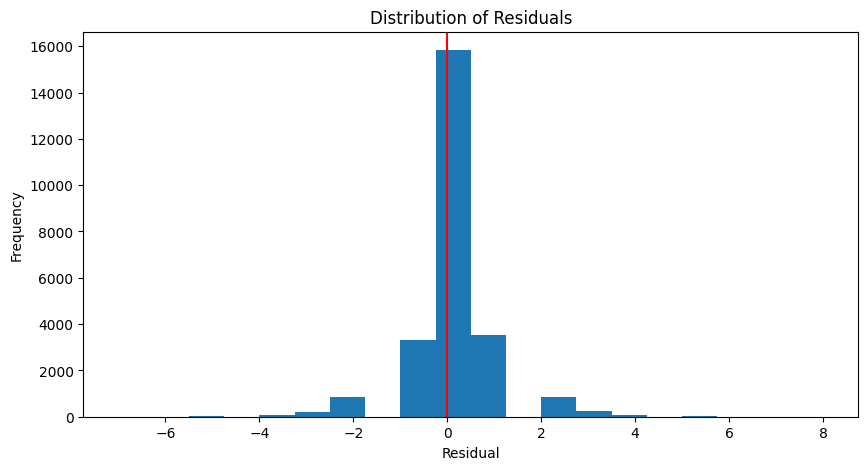

In [98]:
def plot_residuals(actual, predicted):
    residuals = actual - predicted

    plt.figure(figsize=(10, 5))
    plt.hist(residuals, bins=20)
    plt.axvline(x = 0, color = 'r')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Distribution of Residuals')
    plt.show()

plot_residuals(y_test, y_pred_test)

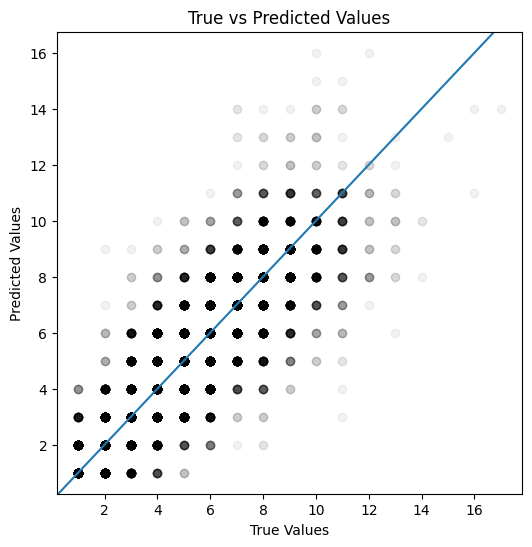

In [99]:
def plot_actual_vs_predicted(actual, predicted):
    fig, ax = plt.subplots(figsize=(6, 6))

    ax.scatter(actual, predicted, color="black", alpha=0.05)
    ax.axline((1, 1), slope=1)
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.title('True vs Predicted Values')
    plt.show()

plot_actual_vs_predicted(y_test, y_pred_test)

Train a boosting model to predict length of stay based on the variables in this dataset.

In [118]:
X = los_df.drop(columns='lengthofstay')
y = los_df['lengthofstay']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size = 0.25,
    random_state=42
    )

regr_xgb = XGBRegressor(random_state=42)

# Train the model using the training sets
regr_xgb.fit(X_train, y_train)

# Make predictions using the testing set
y_pred_train = regr_xgb.predict(X_train)
y_pred_test = regr_xgb.predict(X_test)


In [101]:
y_pred_test

array([3.6313417, 0.8304186, 2.4800673, ..., 5.5354204, 1.5881324,
       5.249632 ], dtype=float32)

Assess the performance of this model and compare it with your decision tree model. 

In [121]:
print("TRAINING DATA")
print(f"Mean absolute error: {mean_absolute_error(y_train, y_pred_train):.2f}")
print(f"Mean absolute percentage error: {mean_absolute_percentage_error(y_train, y_pred_train):.2%}" )
print("Root Mean squared error: %.2f" % root_mean_squared_error(y_train, y_pred_train))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_train, y_pred_train))

TRAINING DATA
Mean absolute error: 0.29
Mean absolute percentage error: 10.66%
Root Mean squared error: 0.37
Coefficient of determination: 0.98


In [120]:
print("TESTING DATA")
print(f"Mean absolute error: {mean_absolute_error(y_test, y_pred_test):.2f}")
print(f"Mean absolute percentage error: {mean_absolute_percentage_error(y_test, y_pred_test):.2%}" )
print("Root Mean squared error: %.2f" % root_mean_squared_error(y_test, y_pred_test))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred_test))

TESTING DATA
Mean absolute error: 0.33
Mean absolute percentage error: 11.60%
Root Mean squared error: 0.44
Coefficient of determination: 0.96


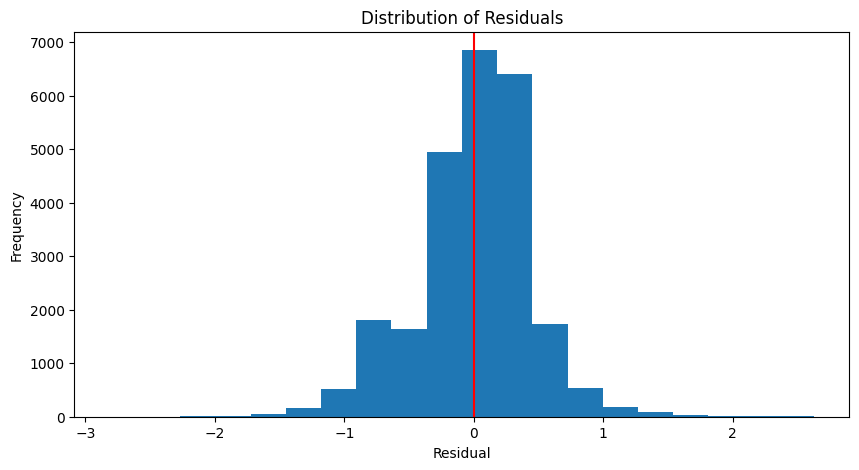

In [76]:
plot_residuals(y_test, y_pred_test)

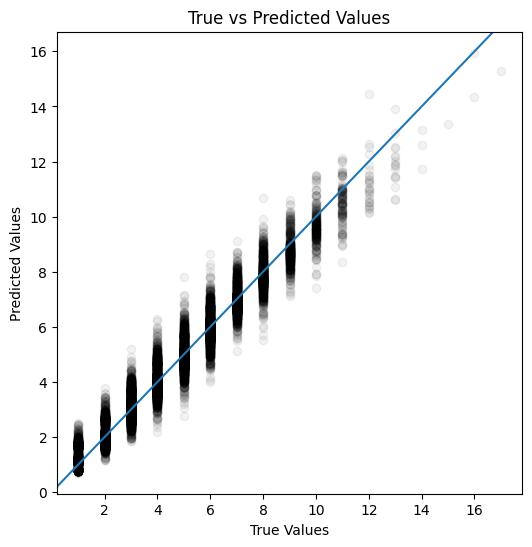

In [82]:
plot_actual_vs_predicted(y_test, y_pred_test)

## Extension

Continue to refine your model. 

You could
- tune hyperparameters
- try additional model types (e.g. different boosting trees, linear regression)
- try dropping some features
- calculate additional metrics
- add some visualisations of the features in the dataset
- store the results from your different model iterations and display this as a table of metrics
- turn this table of metrics into a graph
- try using k-fold cross validation 


In [ ]:
# NO SOLUTION GIVEN

# Challenge

Explore additional aspects of regression modelling using Google, sklearn and other library documentation, Stack Overflow, AI tools, or other avenues. 

Some suggestions to get you started:
- Look up the assumptions of *linear* regression. Would our dataset violate any of these assumptions?
- What about multiple linear regression? 
- Investigate the performance of your model on different subsets of the data. Are the errors lower for male and female patients? How about across the different facilities? 

In [ ]:
# NO SOLUTION GIVEN